<a href="https://colab.research.google.com/github/RokayaNeeraj/TelecomePlan_Prediction/blob/main/Telecom_LogisticRegression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importing Libraries and installing pandas profiling

In [ ]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
from sklearn import datasets
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, recall_score, roc_auc_score, confusion_matrix
from sklearn.utils import resample
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder

<ipython-input-2-0d2d7b39f992>:3: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [ ]:
pip install pandas_profiling

In [ ]:
from google.colab import files
uploaded = files.upload() # to upload files in google colab


# Reading and undestanding the data

In [ ]:
data = pd.read_excel('Telecom.xlsx') # reading the data
data

,CustomerID,PlanTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersons,NumberOfFollowups,PlanPitched,PreferredServiceStar,MaritalStatus,NumberOfUpgrades,iPhone,PitchSatisfactionScore,PhoneContract,NumberOfChildren,Designation,MonthlyIncome
0,200000,1,41.0,Self Enquiry,3,6.0,Salaried,Female,3,3.0,Deluxe,3.0,Single,1.0,1,2,1,0.0,Manager,20993.0
1,200001,0,49.0,Company Invited,1,14.0,Salaried,Male,3,4.0,Deluxe,4.0,Divorced,2.0,0,3,1,2.0,Manager,20130.0
2,200002,1,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,3.0,Single,7.0,1,3,0,0.0,Executive,17090.0
3,200003,0,33.0,Company Invited,1,9.0,Salaried,Female,2,3.0,Basic,3.0,Divorced,2.0,1,5,1,1.0,Executive,17909.0
4,200004,0,NaN,Self Enquiry,1,8.0,Small Business,Male,2,3.0,Basic,4.0,Divorced,1.0,0,5,1,0.0,Executive,18468.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4883,204883,1,49.0,Self Enquiry,3,9.0,Small Business,Male,3,5.0,Deluxe,4.0,Unmarried,2.0,1,1,1,1.0,Manager,26576.0
4884,204884,1,28.0,Company Invited,1,31.0,Salaried,Male,4,5.0,Basic,3.0,Single,3.0,1,3,1,2.0,Executive,21212.0
4885,204885,1,52.0,Self Enquiry,3,17.0,Salaried,Female,4,4.0,Standard,4.0,Married,7.0,0,1,1,3.0,Senior Manager,31820.0
4886,204886,1,19.0,Self Enquiry,3,16.0,Small Business,Male,3,4.0,Basic,3.0,Single,3.0,0,5,0,2.0,Executive,20289.0


In [ ]:
pr = ProfileReport(data) # understanding the data for missing values, correlation and distribution
pr.to_widgets()

/usr/local/lib/python3.10/dist-packages/pandas_profiling/profile_report.py:457: UserWarning: Ipywidgets is not yet fully supported on Google Colab (https://github.com/googlecolab/colabtools/issues/60).As an alternative, you can use the HTML report. See the documentation for more information.
  warnings.warn(


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render widgets:   0%|          | 0/1 [00:00<?, ?it/s]

# Plotting the data to see for outliers and handle it

<Axes: >

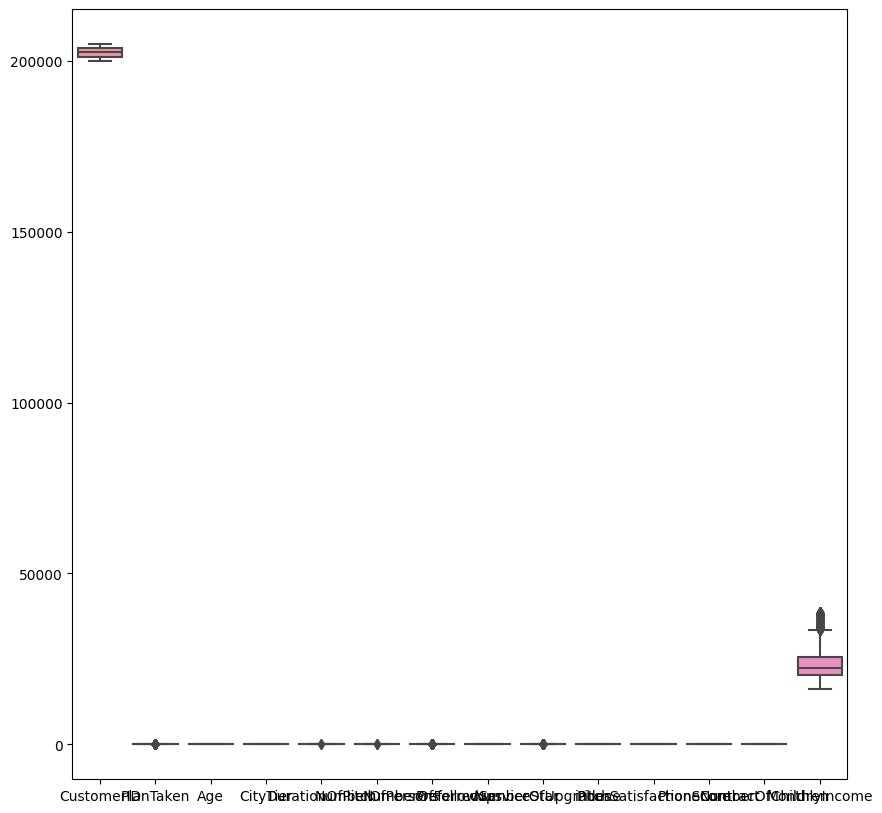

In [ ]:
fig, ax = plt.subplots(figsize = (10,10))
sns.boxplot(data=data)

# using lower and upper bound to remove the top and bottom outliers


In [ ]:
lower_threshold = data['MonthlyIncome'].quantile(0.001)
upper_threshold = data['MonthlyIncome'].quantile(0.999)
data = data[(data['MonthlyIncome'] >= lower_threshold) & (data['MonthlyIncome'] <= upper_threshold)]

<Axes: >

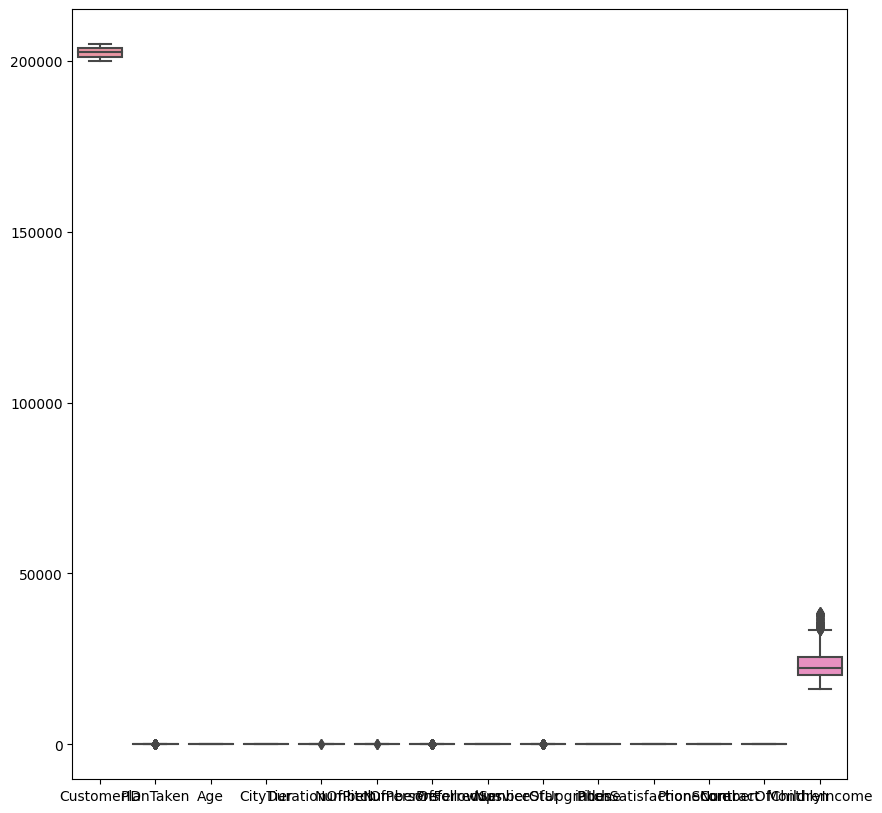

In [ ]:
fig, ax = plt.subplots(figsize = (10,10))
sns.boxplot(data=data) # we can observer there are no more outliers in Monthly Income column

# Assigning the feature and target variable

In [ ]:
y = data.iloc[:, 1] # Plan taken as target variable
X = data.drop(data.columns[0:2], axis=1) # dropped column customer id as it has no importance in our model building and also dropped target variable

# checking for the y and X if the data are assigned properly

In [ ]:
y.head()

0    1
1    0
2    1
3    0
4    0
Name: PlanTaken, dtype: int64

In [ ]:
X.head()

,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersons,NumberOfFollowups,PlanPitched,PreferredServiceStar,MaritalStatus,NumberOfUpgrades,iPhone,PitchSatisfactionScore,PhoneContract,NumberOfChildren,Designation,MonthlyIncome
0,41.0,Self Enquiry,3,6.0,Salaried,Female,3,3.0,Deluxe,3.0,Single,1.0,1,2,1,0.0,Manager,20993.0
1,49.0,Company Invited,1,14.0,Salaried,Male,3,4.0,Deluxe,4.0,Divorced,2.0,0,3,1,2.0,Manager,20130.0
2,37.0,Self Enquiry,1,8.0,Free Lancer,Male,3,4.0,Basic,3.0,Single,7.0,1,3,0,0.0,Executive,17090.0
3,33.0,Company Invited,1,9.0,Salaried,Female,2,3.0,Basic,3.0,Divorced,2.0,1,5,1,1.0,Executive,17909.0
4,NaN,Self Enquiry,1,8.0,Small Business,Male,2,3.0,Basic,4.0,Divorced,1.0,0,5,1,0.0,Executive,18468.0


# Handling Missing Values

In [ ]:
import pandas as pd
from sklearn.impute import SimpleImputer

# Handle numeric columns
numeric_columns = X.select_dtypes(include=['int64', 'float64']).columns # filters numeric columns
imputer = SimpleImputer(strategy="mean")
imputed_data = imputer.fit_transform(X[numeric_columns]) # fills the missing values with mean value of the column
X[numeric_columns] = pd.DataFrame(imputed_data, columns=numeric_columns, index=X.index) #updates the numeric columns in X with the imputed values while preserving the original indices and column names

# Handle object columns
object_columns = X.select_dtypes(include=['object']).columns # filters object columns
imputer = SimpleImputer(strategy="most_frequent")
imputed_data = imputer.fit_transform(X[object_columns]) # fills the missing values with mode of the column
X[object_columns] = pd.DataFrame(imputed_data, columns=object_columns, index=X.index) #updates the object columns in X with the imputed values while preserving the original indices and column names

In [ ]:
X.isna().sum() # checking if there are still null values or not

Age                       0
TypeofContact             0
CityTier                  0
DurationOfPitch           0
Occupation                0
Gender                    0
NumberOfPersons           0
NumberOfFollowups         0
PlanPitched               0
PreferredServiceStar      0
MaritalStatus             0
NumberOfUpgrades          0
iPhone                    0
PitchSatisfactionScore    0
PhoneContract             0
NumberOfChildren          0
Designation               0
MonthlyIncome             0
dtype: int64

# Checking Multicollinearity with Vif Score

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
numeric_data = X.select_dtypes(include=['int64', 'float64']) # Filter the numeric columns from X
vif_df = pd.DataFrame() # initializing empty dataframe to store vif values
vif_df['vif'] = [variance_inflation_factor(numeric_data.values, i) for i in range(numeric_data.shape[1])] #iterating over the indices of the columns
vif_df['feature'] = numeric_data.columns # adding feature column for the numeric data
print(vif_df)

          vif                 feature
0   22.039474                     Age
1    4.143345                CityTier
2    4.293518         DurationOfPitch
3   25.953727         NumberOfPersons
4   15.816011       NumberOfFollowups
5   15.726897    PreferredServiceStar
6    4.550497        NumberOfUpgrades
7    1.413794                  iPhone
8    5.730494  PitchSatisfactionScore
9    2.650979           PhoneContract
10   4.693297        NumberOfChildren
11  30.696269           MonthlyIncome


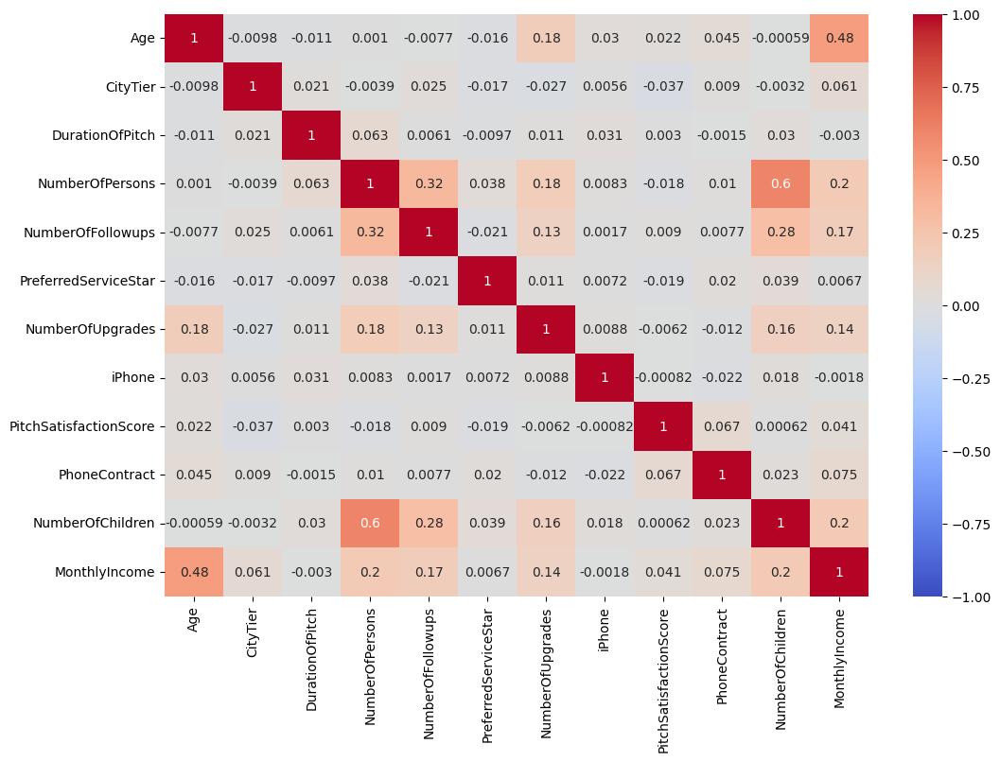

In [ ]:
corr_matrix = numeric_data.corr() # Computing the correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1) # drawing heatmap
plt.show()

# Note: Though the VIF score is high, we can see that the correlation is not much higher between the columns. So, decided to keep it.

# One Hot Encoding

In [ ]:
encoder = OneHotEncoder(drop='first', sparse=False)  # drop='first' to avoid multicollinearity
encoded_features = encoder.fit_transform(X[object_columns])
encoded_X = pd.DataFrame(encoded_features, columns=encoder.get_feature_names_out(object_columns))
encoded_X.index = X.index #Set the index of encoded_X to match X's index
X = X.drop(columns=object_columns) #Drop original object columns from df and concatenate encoded_X
X = pd.concat([X, encoded_X], axis=1)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


# Feature Scaling to reduce the variance

In [ ]:
scaler = StandardScaler()
X = scaler.fit_transform(X)
X

array([[ 0.35929956,  1.45912081, -1.1360444 , ...,  1.38853531,
        -0.43640777, -0.22527233],
       [ 1.22717889, -0.71899387, -0.18351221, ...,  1.38853531,
        -0.43640777, -0.22527233],
       [-0.07464011, -0.71899387, -0.89791135, ..., -0.72018334,
        -0.43640777, -0.22527233],
       ...,
       [ 1.55263363,  1.45912081,  0.17368736, ..., -0.72018334,
         2.29143489, -0.22527233],
       [-2.02736859,  1.45912081,  0.05462084, ..., -0.72018334,
        -0.43640777, -0.22527233],
       [-0.18312502, -0.71899387, -0.18351221, ..., -0.72018334,
        -0.43640777, -0.22527233]])

# Building Logistic Regression Model

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42) # Splitting data in 80% train and 20% test data

#Basic Logistic Regression
clf_basic = LogisticRegression()
clf_basic.fit(X_train, y_train)
y_pred_basic = clf_basic.predict(X_test)
print("Basic Logistic Regression Accuracy:", accuracy_score(y_test, y_pred_basic))

#Logistic Regression with Regularization
clf_reg = LogisticRegression(penalty='l2', C=1.0)  # L2 regularization
clf_reg.fit(X_train, y_train)
y_pred_reg = clf_reg.predict(X_test)

print("\nWith Regularization:")
print("Accuracy:", accuracy_score(y_test, y_pred_reg))
print("Recall:", recall_score(y_test, y_pred_reg))
print("AUC:", roc_auc_score(y_test, y_pred_reg))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_reg))

#Handle Class Imbalance by Oversampling the Minority Class
X_upsampled, y_upsampled = resample(X_train[y_train == 1], y_train[y_train == 1], replace=True,
                                    n_samples=X_train[y_train == 0].shape[0], random_state=42)

X_train_balanced = np.vstack((X_train[y_train == 0], X_upsampled))
y_train_balanced = np.hstack((y_train[y_train == 0], y_upsampled))

clf_balanced = LogisticRegression(penalty='l2', C=1.0)
clf_balanced.fit(X_train_balanced, y_train_balanced)
y_pred_balanced = clf_balanced.predict(X_test)

print("\nAfter Handling Imbalance:")
print("Accuracy:", accuracy_score(y_test, y_pred_balanced))
print("Recall:", recall_score(y_test, y_pred_balanced))

#Cross Validation with Imbalance Handling
skf = StratifiedKFold(n_splits=5, random_state=42, shuffle=True)
cross_val_accuracies = cross_val_score(clf_balanced, X_train_balanced, y_train_balanced, cv=skf, scoring='accuracy')
cross_val_recalls = cross_val_score(clf_balanced, X_train_balanced, y_train_balanced, cv=skf, scoring='recall')

print("\nCross Validation Results with Imbalance Handling:")
print("Average Accuracy:", np.mean(cross_val_accuracies))
print("Average Recall:", np.mean(cross_val_recalls))


Basic Logistic Regression Accuracy: 0.8286637931034483

With Regularization:
Accuracy: 0.8286637931034483
Recall: 0.2937853107344633
AUC: 0.6242561706801477
Confusion Matrix:
 [[717  34]
 [125  52]]

After Handling Imbalance:
Accuracy: 0.7413793103448276
Recall: 0.7005649717514124

Cross Validation Results with Imbalance Handling:
Average Accuracy: 0.758326533444352
Average Recall: 0.7604853022739879
